<a href="https://colab.research.google.com/github/Victorlouisdg/differentiable-cloth-folding/blob/master/folding_variations/folding_5x5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%%capture
!apt install imagemagick

In [0]:
!dpkg -s imagemagick | grep Status

Status: install ok installed


In [0]:
!pip list | grep jax

jax                      0.1.67         
jaxlib                   0.1.47         


In [0]:
import jax 
import jax.numpy as np
from jax import jit, vmap, grad, value_and_grad
from jax import random
from jax.ops import index, index_add, index_update
from jax.lax import cond, scan
from jax.experimental import optimizers
from jax.config import config
config.update("jax_debug_nans", True)

import time
from functools import partial

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import Axes3D, proj3d
from IPython.display import HTML
matplotlib.rc('animation', html='jshtml')

In [0]:
rows = cols = 5
n_masses = rows * cols
length = 1.0
l_rest = length / (rows - 1)
print('Rest length of the springs: {:.5f}m'.format(l_rest))

Rest length of the springs: 0.25000m


In [0]:
def init_position(i, cols, l_rest):
    x = l_rest * np.floor(i / cols)
    y = l_rest * (i % cols)
    z = 0.0
    return np.array([x, y, z], dtype=np.float32)


p0 = np.array([init_position(i, cols, l_rest) for i in np.arange(n_masses)])
v0 = np.zeros((n_masses, 3))
s0 = np.hstack((p0, v0))

print('Shape of the cloth state: ', s0.shape)
print('State of the 5 first masses: \n', s0[:5])

/usr/local/lib/python3.6/dist-packages/jax/lib/xla_bridge.py:116: UserWarning: No GPU/TPU found, falling back to CPU.
  warnings.warn('No GPU/TPU found, falling back to CPU.')


Shape of the cloth state:  (25, 6)
State of the 5 first masses: 
 [[0.   0.   0.   0.   0.   0.  ]
 [0.   0.25 0.   0.   0.   0.  ]
 [0.   0.5  0.   0.   0.   0.  ]
 [0.   0.75 0.   0.   0.   0.  ]
 [0.   1.   0.   0.   0.   0.  ]]


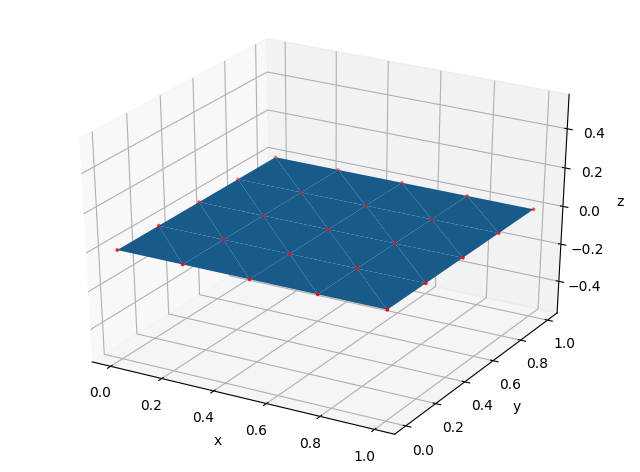

In [0]:
def triangulate(rows, cols):
    triangles = []
    for i in range(rows - 1):
        for j in range(cols - 1):
            k = j + i * cols
            tri1 = (k, k + cols, k + 1)
            tri2 = (k + 1, k + cols, k + cols + 1)
            triangles.append(tri1)
            triangles.append(tri2)
    return triangles


triangles = triangulate(rows, cols)

def plot_cloth(ax, p, 
               xlim=[-0.05, length + 0.05], 
               ylim=[-0.05, length + 0.05], 
               zlim=[-0.55, 0.55]):
    x, y, z = np.transpose(p)
    ax.clear()  # necessary for the animations
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_zlim(zlim)
    ax.plot_trisurf(x, y, z, triangles=triangles)
    ax.scatter(x, y, z, c='red', s=3)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')


fig = plt.figure(figsize=(8, 6), dpi=100)
ax = fig.add_subplot(111, projection='3d')
plot_cloth(ax, p0)

In [0]:
m = 1.0 / n_masses          # kg
k_elastic = 100.0       # N / m
k_shear = 10.0          # N / m
k_bend = 1.0            # N / m
c_elastic = k_elastic / 5  # N / (m/s)
c_shear = k_shear / 5      # N / (m/s)
c_bend = k_bend / 5        # N / (m/s)
g = 9.80665                 # m/s^2
ag = np.array([0.0, 0.0, -g])  # acceleration due to gravity

In [0]:
def shifted_ix(di, dj):
    i, j = np.meshgrid(np.arange(rows), np.arange(cols), indexing='ij')

    # Where bounds are ok for shifted index, use it, else use original index
    result = np.where((i + di >= 0) & (i + di < rows) &
                      (j + dj >= 0) & (j + dj < cols),
                      cols * (i + di) + j + dj,
                      cols * i + j)

    return np.ravel(result)


lix = shifted_ix(0, -1)
tix = shifted_ix(-1, 0)
rix = shifted_ix(0, 1)
bix = shifted_ix(1, 0)

tlix = shifted_ix(-1, -1)
trix = shifted_ix(-1, 1)
brix = shifted_ix(1, 1)
blix = shifted_ix(1, -1)

llix = shifted_ix(0, -2)
ttix = shifted_ix(-2, 0)
rrix = shifted_ix(0, 2)
bbix = shifted_ix(2, 0)

l_rest_shear = np.sqrt(2) * l_rest
l_rest_double = 2 * l_rest


ks = np.array(4 * [k_elastic] + 4 * [k_shear] + 4 * [k_bend])
cs = np.array(4 * [c_elastic] + 4 * [c_shear] + 4 * [c_bend])
l_rests = np.array(4 * [l_rest] + 4 * [l_rest_shear] + 4 * [l_rest_double])
ixs = np.array([lix, tix, rix, bix, tlix, trix, brix, blix, llix, ttix, rrix, bbix])

In [0]:
@jit
def hooke_damped(pa, pb, va, vb, k, c, l_rest):
    d = pb - pa
    is_zero = np.allclose(d, 0.0)
    d_non_zero = np.where(is_zero, np.ones_like(d), d)
    l = np.linalg.norm(d_non_zero)  # norm of zero vector gives NaN in gradient
    l = np.where(is_zero, 0.0, l)
    l_non_zero = np.max((l, l_rest / 10))
    u = d / l_non_zero
    x = (l - l_rest) * u

    # Relative velocity along the spring
    v_rel = vb - va  
    x_dot = np.dot(v_rel, u) * u

    F = k * x + c * x_dot
    return F


hdv = vmap(hooke_damped, in_axes=(0, 0, 0, 0, None, None, None))

def hooke_damped_state(p, v, k, c, lr, ix):
    return hdv(p, p[ix], v, v[ix], k, c, lr)


hdsv = vmap(hooke_damped_state, in_axes=(None, None, 0, 0, 0, 0))


@jit
def hooke_damped_all(p, v):
    return np.sum(hdsv(p, v, ks, cs, l_rests, ixs), axis=0)


@jit
def ground_force(p):
    z = p[:, 2]
    Fz = np.where(z < 0, 200.0 * np.abs(z), 0.0)
    Fz = Fz[:, np.newaxis]  # turn 0-D array into column vector
    zeros = np.zeros((p.shape[0], 1))
    return np.hstack((zeros, zeros, Fz))

In [0]:
immovable_masses = [0, cols * (rows - 1)]
actuated_masses = [cols - 1, rows * cols -1]


# F_act has to be a list of force vectors, with the length of the list equal to the amount of actuated masses

@jit
def change_of_state(s, F_act):
    p, v = np.hsplit(s, 2)
    F = hooke_damped_all(p, v)
    F += ground_force(p)
    F = index_add(F, index[actuated_masses, :], F_act)
    a = F / m
    a += ag
    a = index_update(a, index[immovable_masses, :], 0.0)
    return np.hstack((v, a))

In [0]:
timesteps = 1000          
dt = 0.001                 
actuation_interval = 50


def simulate_step(carry, step_number, controller, params):  
    s, s_controller, F_act = carry

    # Run controller at specific times
    F_act, s_new_controller = cond(
        step_number % actuation_interval == 0,
        (s, s_controller, params), controller,      # if true, run controller
        None, lambda _: (F_act, s_controller)       # if false, use old F_act
    )

    # Advance simulation state with RK4
    f = change_of_state
    k1 = f(s, F_act)
    k2 = f(s + k1 * (dt / 2), F_act)
    k3 = f(s + k2 * (dt / 2), F_act)
    k4 = f(s + k3 * dt, F_act)
    s_new = s + (k1 + 2 * k2 + 2 * k3 + k4) * (dt / 6)

    carry = output = (s_new, s_new_controller, F_act)
    return (carry, output)

In [0]:
@partial(jit, static_argnums=(2,))
def simulate(s0, s0_controller, controller, params):
    simulate_step_jit = jit(partial(simulate_step, controller=controller, params=params))
    F_act0 = [np.zeros(3) for _ in actuated_masses]
    carry0 = (s0, s0_controller, F_act0)
    
    history = scan(simulate_step_jit, carry0, np.arange(timesteps))[1]
    return history

In [0]:
observed_masses = actuated_masses  # only state of the actuated corners is observed

@jit
def neural_net(inputs):
    s, s_controller, params = inputs
    p, v = np.hsplit(s, 2)
    W0, b0 = params

    x = np.ravel(p[observed_masses])  # flattens s into a vector
    x = np.dot(W0, x)
    x = np.add(b0, x)

    F_act = np.split(x, len(actuated_masses))
    return (F_act, s_controller)



# Neural net parameter shapes
in0 = np.prod(p0[observed_masses].shape)
out0 = len(actuated_masses) * 3
W0_shape = (out0, in0)
b0_shape = (out0,)
shapes = (W0_shape, b0_shape)

# Initializing the neural net parameters
key = random.PRNGKey(0)
key, *subkeys = random.split(key, len(shapes) + 1)
W0 = random.normal(subkeys[0], shape=W0_shape) / 10
b0 = random.normal(subkeys[1], shape=b0_shape) / 10
b0 += np.array([0.0, 0.0, 1.0] * len(actuated_masses))

params0_nn = (W0, b0)
s0_nn = 0

In [0]:
history = simulate(s0, s0_nn, neural_net, params0_nn)
s_history, s_controller_history, F_history = history

# Adds initial state to the front of s_hitsory
s_history = np.vstack((s0[np.newaxis, :], s_history))

# Repeats final F (this is so that the final visualized frame also shows arrows)
F_history = [np.vstack((Fs, Fs[-1])) for Fs in F_history]

In [0]:
class Arrow3D(FancyArrowPatch):
    # Arrow plotting code from: 
    # https://stackoverflow.com/questions/22867620/putting-arrowheads-on-vectors-in-matplotlibs-3d-plot
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)


def plot_arrow(ax, start, force, scale):
    end = start + scale * force
    x0, y0, z0 = start
    x1, y1, z1 = end
    a = Arrow3D([x0, x1], [y0, y1], [z0, z1], mutation_scale=10, lw=3, arrowstyle="-|>", color="mediumseagreen", zorder=10)
    ax.add_artist(a)

In [0]:
def animate_cloth(s_history, dt, fps=60, F_history=None, force_scale=0.2, gifname=None):
    fig = plt.figure(figsize=(5, 5), dpi=100)
    fig.subplots_adjust(0,0,1,1,0,0)
    ax = fig.add_subplot(111, projection='3d')
    plt.close()  # prevents duplicate output 

    fps_simulation = 1 / dt
    skip = np.floor(fps_simulation / fps).astype(np.int32)
    fps_adjusted = fps_simulation / skip
    print('fps was adjusted to:', fps_adjusted)

    def animate(i):
        j = min(i * skip, len(s_history) - 1)
        p = s_history[j][:, 0:3]
        plot_cloth(ax, p)
        ax.text2D(0.1, 0.9, 't = {:.3f}s'.format(j * dt), transform=ax.transAxes)
        if F_history is not None:
            for mass_id, F in zip(actuated_masses, F_history):
                plot_arrow(ax, p[mass_id], F[j], force_scale) 


    n_frames = (len(s_history) - 1) // skip + 1  # this +1 is for the initial frame
    if not (len(s_history) - 1) % skip == 0:
        n_frames += 1  # this +1 is to ensure the final frame is shown

    anim = animation.FuncAnimation(fig, animate, frames=n_frames, interval=1000*dt*skip)

    if gifname is not None:
        anim.save(gifname + '.gif', writer='imagemagick')

    return anim

animate_cloth(s_history, dt, F_history=F_history)

fps was adjusted to: 62.5


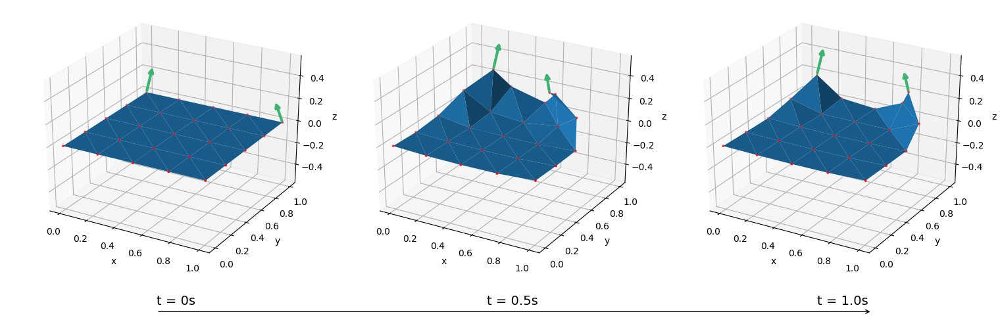

In [0]:
def plot_cloth_history(history):
    s_history, s_controller_history, F_history = history

    fig = plt.figure(figsize=(15, 4), dpi=100, facecolor='white')
    fig.subplots_adjust(0, 0, 1, 1, 0.01, 0)
    ax1 = fig.add_subplot(131, projection='3d')
    ax2 = fig.add_subplot(132, projection='3d')
    ax3 = fig.add_subplot(133, projection='3d')

    def plot_with_forces(ax, i):
        p = s_history[i][:, 0:3]
        plot_cloth(ax, p)
        for mass_id, F in zip(actuated_masses, F_history):
                        plot_arrow(ax, p[mass_id], F[i], 0.2) 


    t1 = timesteps // 2
    t2 = timesteps

    plot_with_forces(ax1, 0)
    plot_with_forces(ax2, t1)
    plot_with_forces(ax3, t2)

    # Super ad hoc code to plot time arrow below plot, probably very brittle
    x0 = -0.01
    x1 = 0.395
    y = -0.125
    dy = 0.005
    ax1.annotate("", xy=(x1, y), xytext=(x0, y), arrowprops=dict(arrowstyle="->"), annotation_clip=False)
    ax1.annotate("t = 0s", xy=(x0, y + dy), annotation_clip=False, fontsize=14)
    ax2.annotate("t = {}s".format(t1*dt), xy=(x0, y + dy), annotation_clip=False, fontsize=14)
    ax3.annotate("t = {}s".format(t2*dt), xy=(x0, y + dy), annotation_clip=False, fontsize=14)

plot_cloth_history(history)

The initial configuration has a loss of  0.25064 m^2 (average squared distance to target)


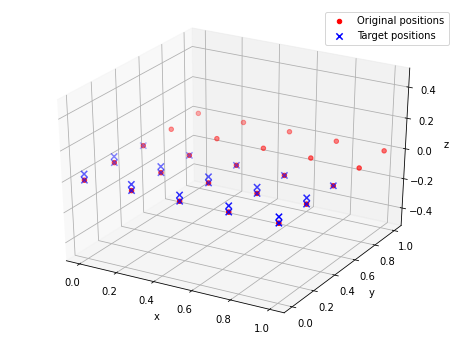

In [0]:
targets = []
y_fold = length / 2 
for i in range(n_masses):
    x, y, z = p0[i]
    if y > y_fold:
        y = y - 2 * (y - y_fold)  # mirror y over fold
        z += 0.04                 # raise z slightly
    targets.append((x, y, z))
targets = np.array(targets)

@jit
def folding_loss(p):
    return np.sum(np.square(targets - p)) / n_masses


print('The initial configuration has a loss of ', folding_loss(p0), 'm^2 (average squared distance to target)')

x, y, z = np.transpose(p0)
tx, ty, tz = np.transpose(targets)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='red')
ax.scatter(tx, ty, tz, c='blue', marker='x', s=40)
ax.set_zlim([-0.50, 0.50])
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.legend(['Original positions', 'Target positions']);

In [0]:
def loss(params, s0, s0_controller, controller):
    s_history, _, _ = simulate(s0, s0_controller, controller, params)
    s = s_history[-1]
    p, v = np.hsplit(s, 2)
    return folding_loss(p)


loss_nn = partial(loss, s0=s0, s0_controller=s0_nn, controller=neural_net)

Grad compile time: 18.120 seconds
Initial loss:  0.22918902
W0 grad values go from  -0.041403208  to  0.067757525


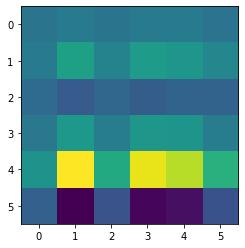

In [0]:
start = time.time()
grad_loss_nn = value_and_grad(jit(loss_nn))
loss0, grad0 = grad_loss_nn(params0_nn)
grad_W0 = grad0[0] 

print('Grad compile time: {:.3f} seconds'.format(time.time() - start))
print('Initial loss: ', loss0)
print('W0 grad values go from ', np.min(grad_W0), ' to ', np.max(grad_W0))

plt.figure()
plt.imshow(grad_W0, interpolation="none");

In [0]:
losses = []

def training_loop(n, grad_loss, params0):
    # Setup optimizer
    learning_rate_scheduler = optimizers.polynomial_decay(0.01, n, 0.0001)
    opt_init, opt_update, get_params = optimizers.adam(learning_rate_scheduler)
    opt_state = opt_init(params0)

    for i in range(n):
        iter_start = time.time()
        params = get_params(opt_state)
        loss_val, gradient = grad_loss(params)
        opt_state = opt_update(i, gradient, opt_state)
        losses.append(loss_val)
        iter_end = time.time()
        print('Iteration ' + str(i) + ': loss = {:.7f} ({:.3f}s)'.format(loss_val, iter_end - iter_start))
    return get_params(opt_state)


optimized_params = training_loop(100, grad_loss_nn, params0_nn)

Iteration 0: loss = 0.2291890 (0.531s)
Iteration 1: loss = 0.2186242 (0.219s)
Iteration 2: loss = 0.2084879 (0.213s)
Iteration 3: loss = 0.1991789 (0.212s)
Iteration 4: loss = 0.1883090 (0.207s)
Iteration 5: loss = 0.1720448 (0.212s)
Iteration 6: loss = 0.1526365 (0.209s)
Iteration 7: loss = 0.1308008 (0.220s)
Iteration 8: loss = 0.1078965 (0.214s)
Iteration 9: loss = 0.0858321 (0.212s)
Iteration 10: loss = 0.0670329 (0.221s)
Iteration 11: loss = 0.0525687 (0.216s)
Iteration 12: loss = 0.0412134 (0.210s)
Iteration 13: loss = 0.0335790 (0.212s)
Iteration 14: loss = 0.0302535 (0.210s)
Iteration 15: loss = 0.0288023 (0.211s)
Iteration 16: loss = 0.0301632 (0.216s)
Iteration 17: loss = 0.0329100 (0.215s)
Iteration 18: loss = 0.0342209 (0.213s)
Iteration 19: loss = 0.0335707 (0.215s)
Iteration 20: loss = 0.0309008 (0.224s)
Iteration 21: loss = 0.0268871 (0.224s)
Iteration 22: loss = 0.0224680 (0.214s)
Iteration 23: loss = 0.0183274 (0.215s)
Iteration 24: loss = 0.0147559 (0.211s)
Iteration 

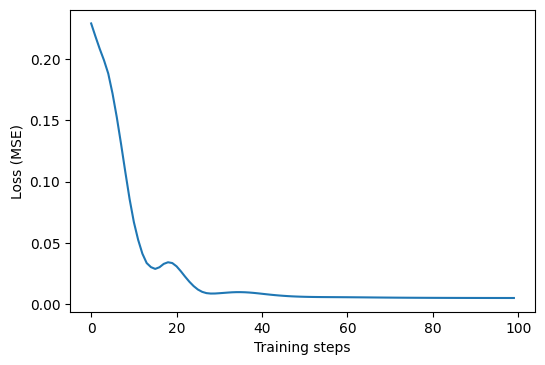

In [0]:
plt.figure(dpi=100)
plt.plot(losses)
plt.xlabel('Training steps')
plt.ylabel('Loss (MSE)');

In [0]:
history_opt = simulate(s0, s0_nn, neural_net, optimized_params)
s_history_opt, s_controller_history_opt, F_history_opt = history_opt

s_history_opt = np.vstack((s0[np.newaxis, :], s_history_opt))
F_history_opt = [np.vstack((Fs, Fs[-1])) for Fs in F_history_opt]

animate_cloth(s_history_opt, dt, F_history=F_history_opt)

fps was adjusted to: 62.5


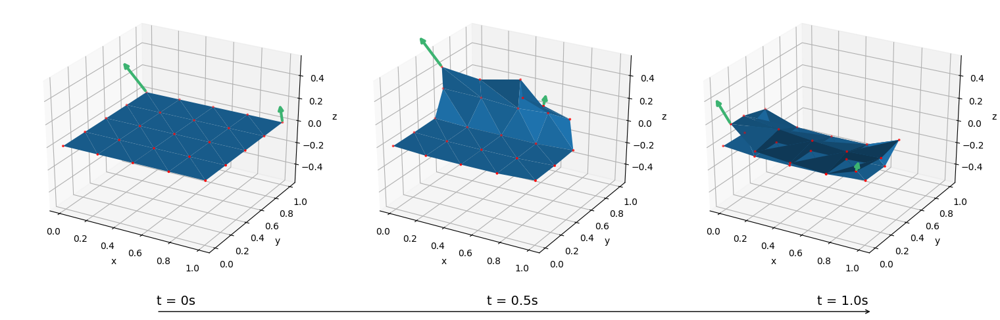

In [0]:
plot_cloth_history(history_opt)

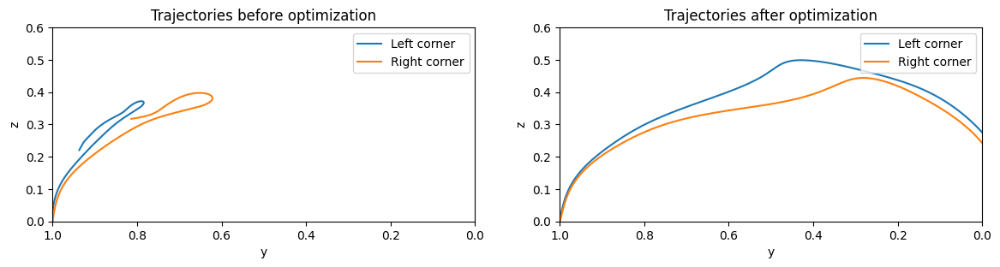

In [0]:
def plot_yz(ax, s_history, masses, title, legend):
    p, v = np.dsplit(s_history, 2)
    for mass in masses:
        py = p[:, mass, 1]
        pz = p[:, mass, 2]
        ax.plot(py, pz)

    ax.invert_xaxis()
    ax.set_title(title)
    ax.set_xlim([1.0, 0.0])
    ax.set_ylim([0.0, 0.6])
    ax.set_xlabel('y')
    ax.set_ylabel('z')
    ax.legend(legend, loc='upper right')


fig = plt.figure(figsize=(14, 3), dpi=100)
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

legend = ['Left corner', 'Right corner']
plot_yz(ax1, s_history, actuated_masses, 'Trajectories before optimization', legend)
plot_yz(ax2, s_history_opt, actuated_masses, 'Trajectories after optimization',legend)